In [58]:
# numerics
import numpy as np

# load in plotting routines
#   cm needed for other color maps
#   colors needed to offset color ranges (e.g., set middle value)
# import matplotlib.pyplot as plt
# from matplotlib import cm
# from matplotlib import colors

# add mapping routines
# import cartopy.crs as ccrs
# import cartopy.feature as cf
# import matplotlib.ticker as mticker
# from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# add shape file packages
import geopandas as gpd
# from cartopy.feature import ShapelyFeature
# import cartopy.io.shapereader as shpreader

#  NOTE: this is needed to get the right PROJ directory; without it you'll 
#        see an error on missing EPSF projection.  For details, see 
#        https://pyproj4.github.io/pyproj/stable/gotchas.html#internal-proj-error-sqlite-error-on-select
#        To get data directory being used: pyproj.datadir.get_data_dir()
#        To change the data directory: pyproj.datadir.set_data_dir()
import pyproj
pyproj.datadir.set_data_dir('/opt/anaconda3/share/proj')

# working with OPeNDAP files
import netCDF4 as nc
import xarray as xr

# working with matlab binary files
import scipy.io

# import pandas for data handling and dates
import pandas as pd

# import datetime for date handling
import datetime as dt

# use this for progress bars (and use trange instead of range)
# from tqdm.notebook import tqdm, trange

from shapely.geometry import Point
from geopandas import GeoDataFrame


from geovoronoi import voronoi_regions_from_coords, points_to_coords


/opt/anaconda3/envs/cmip6/lib/python3.9/site-packages/pyproj/datadir.py:38: UserWarning: pyproj unable to set database path.
  _global_context_set_data_dir()


In [3]:
oisst_url = 'http://apdrc.soest.hawaii.edu:80/dods/public_data/NOAA_SST/OISST/monthly'

In [ ]:
With margins (0.1 degree margin):
   Long: 129.4088, Lat: 1.5214
   Long: 137.0541, Lat: 1.5214
   Long: 137.0541, Lat: 11.6587
   Long: 129.4088, Lat: 11.6587

In [13]:
minlat = 1.5214
maxlat = 11.6587
minlon = 129.4088
maxlon = 137.0541
year1 = '1961'
year2 = '1990'

date1 = '1961-01-01'
date2 = '1990-12-31'

In [7]:
oisst_url = "http://apdrc.soest.hawaii.edu:80/dods/public_data/NOAA_SST/OISST/Monthly_high_res/sst"

In [8]:
oisst = xr.open_dataset(oisst_url, decode_times=True)

/opt/anaconda3/envs/cmip6/lib/python3.9/site-packages/xarray/coding/times.py:150: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)


In [16]:
base_period_oisst = oisst['sst'].loc[{'lat': slice(minlat,maxlat),
                              'lon': slice(minlon,maxlon),
                             'time': slice(date1,date2)}]

In [17]:
base_period_oisst

<xarray.DataArray 'sst' (time: 112, lat: 41, lon: 30)>
[137760 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 1990-12-01
  * lat      (lat) float64 1.625 1.875 2.125 2.375 ... 10.88 11.12 11.38 11.62
  * lon      (lon) float64 129.6 129.9 130.1 130.4 ... 136.1 136.4 136.6 136.9
Attributes:
    long_name:  monthly mean of sea surface temperature

In [21]:
oisst_df = base_period_oisst.to_dataframe()

In [33]:
oisst_df

sst
time       lat    lon               
1981-09-01 1.625  129.625  29.381332
                  129.875  29.436666
                  130.125  29.394333
                  130.375  29.345667
                  130.625  29.289665
...                              ...
1990-12-01 11.625 135.875  27.721613
                  136.125  27.644194
                  136.375  27.560966
                  136.625  27.548710
                  136.875  27.609676

[137760 rows x 1 columns]

In [26]:
from shapely import geometry
p1 = geometry.Point(129.5088 -0.1,1.6214-0.25)
p2 = geometry.Point(136.9541 + 0.1, 1.6214-0.25)
p3 = geometry.Point(136.9541+0.1,11.5587+0.1)
p4 = geometry.Point(129.5088-0.1,11.5587+0.1)

pointList = [p1, p2, p3, p4, p1]
poly = geometry.Polygon([[p.x, p.y] for p in pointList])

sdf = pd.DataFrame(
    {
        "Country": ["Palau"],
        "geometry": [poly
        ],
    }
)
gdf = gpd.GeoDataFrame(sdf, geometry="geometry")

In [30]:
from shapely.ops import cascaded_union
from pandas import Timestamp

In [85]:
# boundary = gpd.read_file('palauEEZ.geojson')
boundary = gdf
boundary = boundary.explode()
boundary = boundary.set_crs(crs="EPSG:3395", allow_override=True)
boundary_shape = cascaded_union(boundary.geometry)

df_eez = gpd.read_file('palauEEZ.geojson')
eez = df_eez['geometry'].values[0]

def getAllSSTJSON(df, time = Timestamp('1981-09-01 00:00:00')):
    df_slice = df[df['time'] == time]
#     max_index = df_slice[df_slice['level']!=4.0].groupby(['latitude', 'longitude', 'time'])['sst'].idxmax()
#     df_slice = df.loc[max_index]


    coordinates = df_slice[['lat','lon','sst']]
    coordinates = coordinates.drop_duplicates()

    df_slice = df_slice.sort_values(by=['lon','lat'], ascending=[False,True])
    df_slice['new_col'] = list(zip(df_slice.lat, df_slice.lon))#         coordinates = coordinates.drop_duplicates()
    coordinates = []

    for c in df_slice['new_col']:
        coordinates.append([c[0],c[1]])
    points = []
    for x in coordinates:
        points.append(Point(x[1],x[0]))
        
    points_gdf = GeoDataFrame(crs="EPSG:3395", geometry=points)
    gdf_proj = points_gdf.to_crs(boundary.crs)

    coords = points_to_coords(gdf_proj.geometry)
    poly_shapes, pts = voronoi_regions_from_coords(coords, boundary_shape)
    

    vdf = pd.DataFrame.from_dict(pts, orient='index', columns = ['pts'])
    voronoi_poly = GeoDataFrame(vdf, crs="EPSG:3395", geometry=list(poly_shapes.values()))

    
    voronoi_poly["lon"] = voronoi_poly.apply(lambda row: coords[row['pts']][0], axis=1)
    voronoi_poly["lat"] = voronoi_poly.apply(lambda row: coords[row['pts']][1], axis=1)
    df_slice = df_slice.drop(['new_col'], axis=1)
    #not needed line
    df_slice = df_slice. sort_values(by=['lon','lat'], ascending=[False,True])    
    df_slice['geometry'] = voronoi_poly.sort_values(by=['lon','lat'], ascending=[False,True])['geometry'].tolist()
    df_slice = df_slice.reset_index()
    df_slice = df_slice.drop('index',axis=1)
    
    json_gdf = GeoDataFrame(df_slice,crs="EPSG:3395")
    palau_land = gpd.read_file('palau.geojson')
    palau_land = palau_land.drop(['type','id','tags','meta'],axis = 1)
    palau_land = palau_land[palau_land.geometry.type != 'LineString']
    trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
    
    palau_eez = gpd.read_file('palauEEZ.geojson')
    trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")

#     trimmed['fill'] = trimmed.apply(assign_sst, axis=1)
    
#     trimmed['coords'] = trimmed['latitude'] + trimmed['longitude']
    trimmed['point'] = trimmed.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    
    laea_polygons = trimmed['geometry'].to_crs(f'+proj=laea +lat_0={eez.centroid.coords[0][1]} +lon_0={eez.centroid.coords[0][0]} +x_0=0 +y_0=0 +a=6371000 +b=6371000 +units=m +no_defs')
    trimmed['area'] = laea_polygons.area
    trimmed['parea'] = trimmed['area']/trimmed['area'].sum()
    
#     print(df_slice)
    
    df_slice['point'] = df_slice.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    
    df_slice = df_slice[df_slice['point'].isin(trimmed['point'].unique())]
    
    
    df_filtered = pd.merge(df_slice, trimmed[['geometry', 'point','area','parea']], on='point', how='left')
    
#     df_filtered['fill'] = df_filtered.apply(assign_sst, axis=1)



#     json_gdf = GeoDataFrame(df_slice,crs="EPSG:3395")
    
#     palau_land = gpd.read_file('palau.geojson')
#     palau_land = palau_land.drop(['type','id','tags','meta'],axis = 1)
#     palau_land = palau_land[palau_land.geometry.type != 'LineString']
#     trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
    
#     palau_eez = gpd.read_file('palauEEZ.geojson')
#     trimmed = gpd.overlay(trimmed,palau_eez, how = "intersection")

    
    
#     fig, ax = plt.subplots(figsize=(12, 10))
#     boundary.plot(ax=ax, color="gray")
#     trimmed.plot(ax=ax)
#     points_gdf.plot(ax=ax, markersize=1, color="black")
#     ax.axis("off")
#     plt.axis('equal')
#     plt.show()

    
    
    
    
    
    
    
    return df_filtered

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:3: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  boundary = boundary.explode()
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:5: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  boundary_shape = cascaded_union(boundary.geometry)


In [62]:
oisst_df[oisst_df['time'] == Timestamp('1981-09-01 00:00:00')]

,time,lat,lon,sst,point
0,1981-09-01,1.625,129.625,29.381332,POINT (129.625 1.625)
1,1981-09-01,1.625,129.875,29.436666,POINT (129.875 1.625)
2,1981-09-01,1.625,130.125,29.394333,POINT (130.125 1.625)
3,1981-09-01,1.625,130.375,29.345667,POINT (130.375 1.625)
4,1981-09-01,1.625,130.625,29.289665,POINT (130.625 1.625)
...,...,...,...,...,...
1225,1981-09-01,11.625,135.875,28.936333,POINT (135.875 11.625)
1226,1981-09-01,11.625,136.125,29.050999,POINT (136.125 11.625)
1227,1981-09-01,11.625,136.375,29.112999,POINT (136.375 11.625)
1228,1981-09-01,11.625,136.625,29.102333,POINT (136.625 11.625)


In [39]:
oisst_df.reset_index(inplace= True)

In [41]:
oisst_df

,time,lat,lon,sst
0,1981-09-01,1.625,129.625,29.381332
1,1981-09-01,1.625,129.875,29.436666
2,1981-09-01,1.625,130.125,29.394333
3,1981-09-01,1.625,130.375,29.345667
4,1981-09-01,1.625,130.625,29.289665
...,...,...,...,...
137755,1990-12-01,11.625,135.875,27.721613
137756,1990-12-01,11.625,136.125,27.644194
137757,1990-12-01,11.625,136.375,27.560966
137758,1990-12-01,11.625,136.625,27.548710


/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/764638197.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/764638197.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/764638197.py:85: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the oth

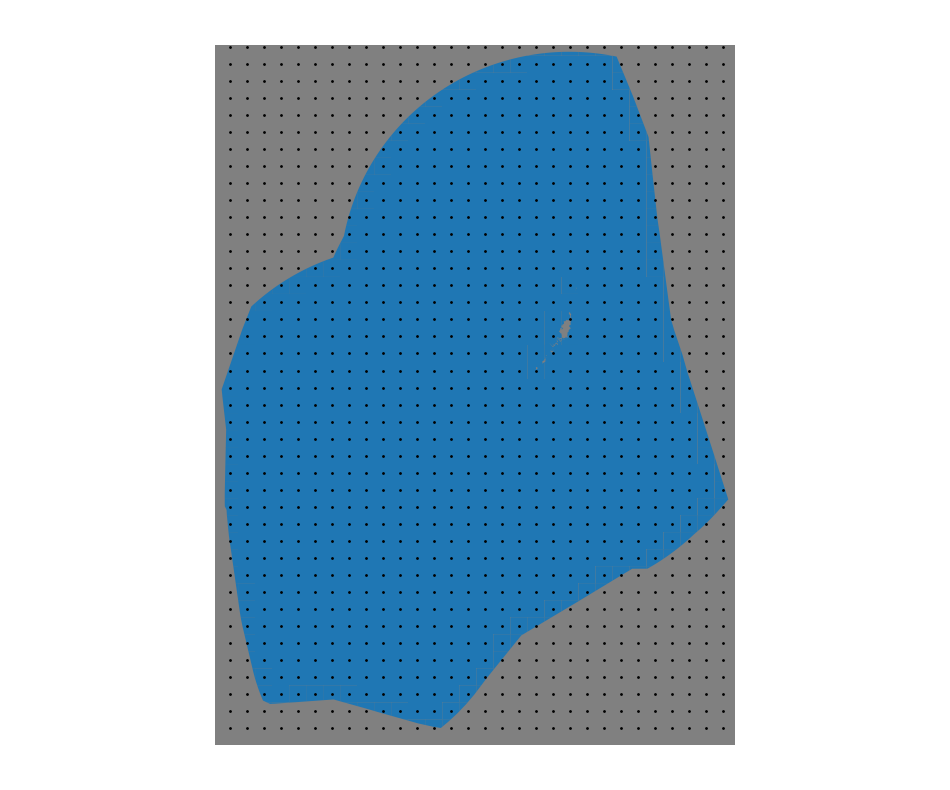

In [80]:
parea_oisst = getAllSSTJSON(oisst_df)

In [81]:
parea_oisst

,time,lat,lon,sst,point,geometry_x,geometry_y,area,parea
0,1981-09-01,4.875,136.875,29.078999,POINT (136.875 4.875),"POLYGON ((136.750 4.750, 136.750 5.000, 137.05...","POLYGON ((136.750 4.753, 136.750 5.000, 136.94...",0.027392,0.000542
1,1981-09-01,5.125,136.875,29.069332,POINT (136.875 5.125),"POLYGON ((137.054 5.000, 136.750 5.000, 136.75...","POLYGON ((136.948 5.000, 136.750 5.000, 136.75...",0.039583,0.000783
2,1981-09-01,5.375,136.875,29.052334,POINT (136.875 5.375),"POLYGON ((136.750 5.250, 136.750 5.500, 137.05...","POLYGON ((136.750 5.250, 136.750 5.500, 136.78...",0.019536,0.000386
3,1981-09-01,5.625,136.875,29.080332,POINT (136.875 5.625),"POLYGON ((137.054 5.500, 136.750 5.500, 136.75...","POLYGON ((136.788 5.500, 136.750 5.500, 136.75...",0.002257,0.000045
4,1981-09-01,4.625,136.625,29.018999,POINT (136.625 4.625),"POLYGON ((136.500 4.750, 136.750 4.750, 136.75...","POLYGON ((136.500 4.750, 136.747 4.750, 136.74...",0.030710,0.000607
...,...,...,...,...,...,...,...,...,...
870,1981-09-01,6.375,129.625,28.762999,POINT (129.625 6.375),"POLYGON ((129.409 6.500, 129.750 6.500, 129.75...","POLYGON ((129.518 6.500, 129.750 6.500, 129.75...",0.054622,0.001080
871,1981-09-01,6.625,129.625,28.830334,POINT (129.625 6.625),"POLYGON ((129.750 6.500, 129.409 6.500, 129.40...","POLYGON ((129.750 6.500, 129.518 6.500, 129.51...",0.056165,0.001111
872,1981-09-01,6.875,129.625,28.871666,POINT (129.625 6.875),"POLYGON ((129.750 6.750, 129.409 6.750, 129.40...","POLYGON ((129.750 6.750, 129.561 6.750, 129.63...",0.036739,0.000726
873,1981-09-01,7.125,129.625,28.906666,POINT (129.625 7.125),"POLYGON ((129.409 7.250, 129.750 7.250, 129.75...","POLYGON ((129.733 7.250, 129.750 7.250, 129.75...",0.015161,0.000300


In [83]:
oisst_df['time'].unique()

array(['1981-09-01T00:00:00.000000000', '1981-10-01T00:00:00.000000000',
       '1981-11-01T00:00:00.000000000', '1981-12-01T00:00:00.000000000',
       '1982-01-01T00:00:00.000000000', '1982-02-01T00:00:00.000000000',
       '1982-03-01T00:00:00.000000000', '1982-04-01T00:00:00.000000000',
       '1982-05-01T00:00:00.000000000', '1982-06-01T00:00:00.000000000',
       '1982-07-01T00:00:00.000000000', '1982-08-01T00:00:00.000000000',
       '1982-09-01T00:00:00.000000000', '1982-10-01T00:00:00.000000000',
       '1982-11-01T00:00:00.000000000', '1982-12-01T00:00:00.000000000',
       '1983-01-01T00:00:00.000000000', '1983-02-01T00:00:00.000000000',
       '1983-03-01T00:00:00.000000000', '1983-04-01T00:00:00.000000000',
       '1983-05-01T00:00:00.000000000', '1983-06-01T00:00:00.000000000',
       '1983-07-01T00:00:00.000000000', '1983-08-01T00:00:00.000000000',
       '1983-09-01T00:00:00.000000000', '1983-10-01T00:00:00.000000000',
       '1983-11-01T00:00:00.000000000', '1983-12-01

In [95]:
avg_sst = {}
for month in oisst_df['time'].unique():
    current_month = getAllSSTJSON(oisst_df, time = month)
    current_month['sst_parea'] = current_month['sst'] * current_month['parea']
    avg_sst[month] = current_month['sst_parea'].sum()

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

In [99]:
avg_sst_df = pd.DataFrame(list(avg_sst.items()), columns=['time', 'sst'])
avg_sst_df['month'] = avg_sst_df['time'].dt.month

In [101]:
std_by_month = avg_sst_df.groupby('month')['sst'].std()

In [102]:
std_by_month

month
1     0.367792
2     0.388431
3     0.289685
4     0.217079
5     0.276595
6     0.216910
7     0.408253
8     0.393790
9     0.458990
10    0.268110
11    0.231529
12    0.271392
Name: sst, dtype: float64

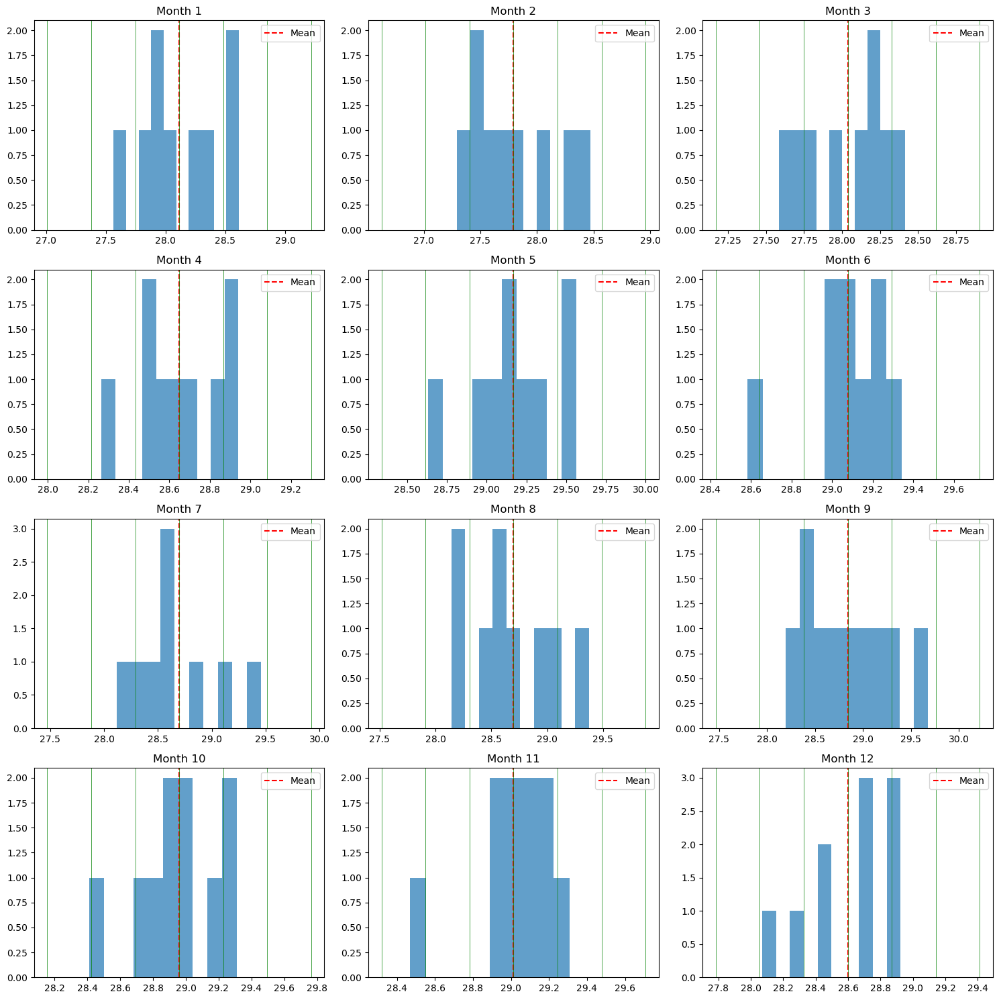

In [111]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15))
months = std_by_month.index

for i, month in enumerate(months, 1):
    ax = axs[(i-1)//3, (i-1)%3]
    values = avg_sst_df[avg_sst_df['month'] == month]['sst']
    mean = values.mean()
    std = std_by_month[month]
    ax.hist(values, bins=10, alpha=0.7)
    ax.axvline(mean, color='r', linestyle='--', label='Mean')
    for j in range(-3, 4):
        ax.axvline(mean + j * std, color='g', linestyle='-', linewidth=0.5)
    ax.set_title(f'Month {month}')
    ax.legend()
#     break

# Adjust layout
plt.tight_layout()
plt.show()

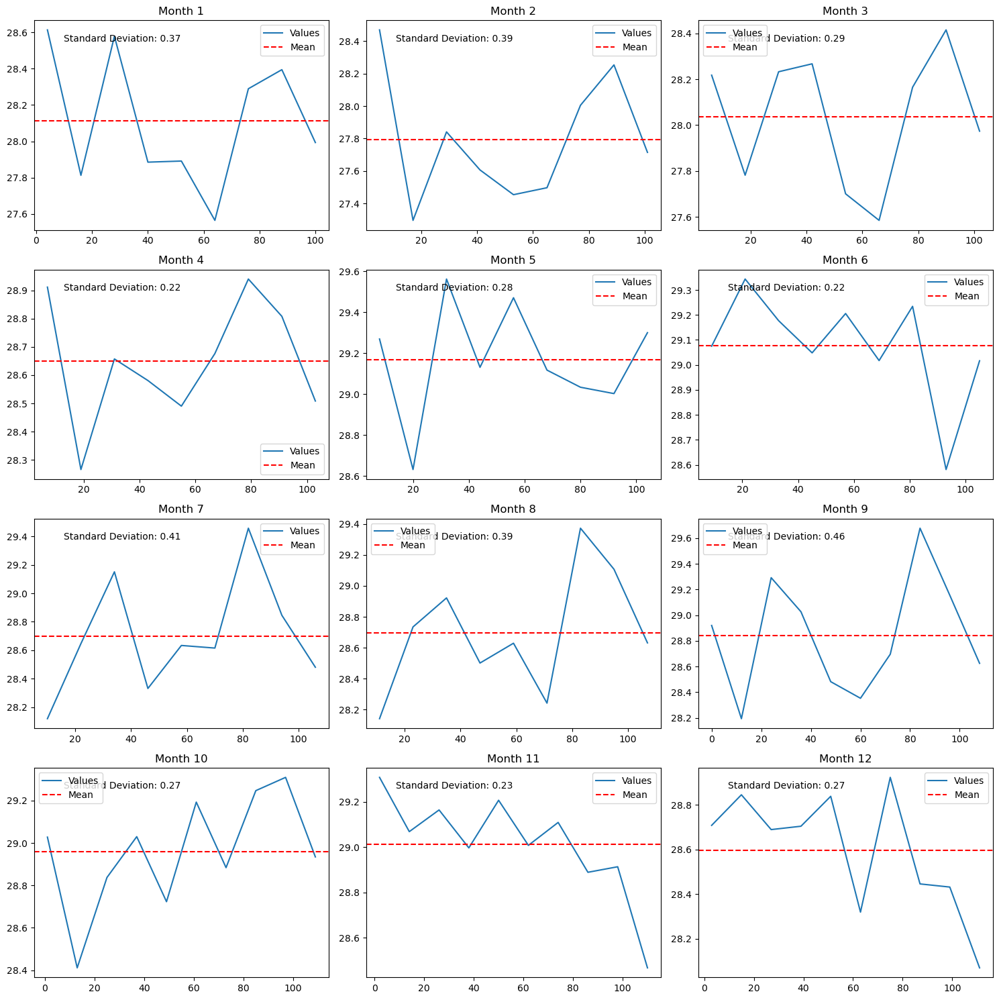

In [106]:
# Create subplots for each month
fig, axs = plt.subplots(4, 3, figsize=(15, 15))
months = std_by_month.index

for i, month in enumerate(months, 1):
    ax = axs[(i-1)//3, (i-1)%3]
    values = avg_sst_df[avg_sst_df['month'] == month]['sst']
    std = std_by_month[month]
    ax.plot(values, label='Values')
    ax.axhline(y=values.mean(), color='r', linestyle='--', label='Mean')
    ax.text(0.1, 0.9, f'Standard Deviation: {std:.2f}', transform=ax.transAxes, fontsize=10)
    ax.set_title(f'Month {month}')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

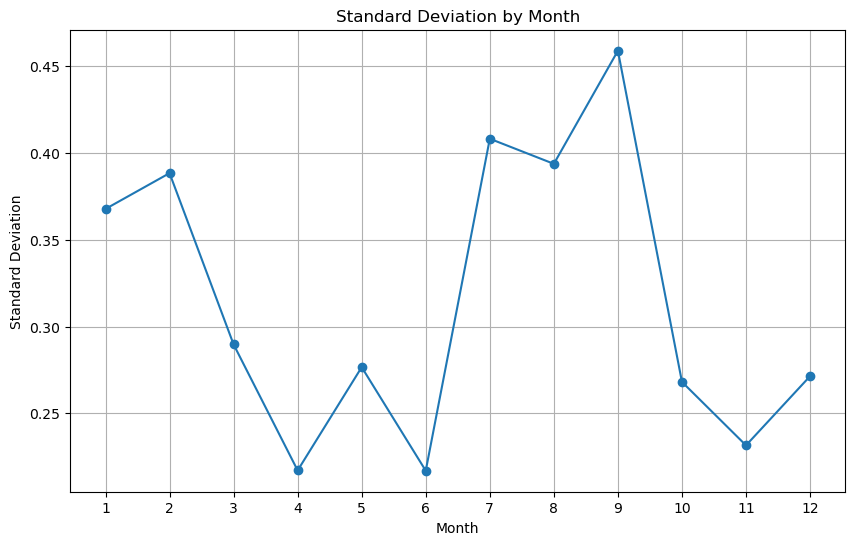

In [103]:
# Plot standard deviation curve for each month
plt.figure(figsize=(10, 6))
months = std_by_month.index
std_devs = std_by_month.values
plt.plot(months, std_devs, marker='o', linestyle='-')
plt.title('Standard Deviation by Month')
plt.xlabel('Month')
plt.ylabel('Standard Deviation')
plt.xticks(range(1, 13))  # Ensure all months are shown on x-axis
plt.grid(True)
plt.show()

In [112]:
oisst_daily_url = "http://apdrc.soest.hawaii.edu:80/dods/public_data/NOAA_SST/OISST_AVHRR/daily_v2.1_1981-2015"
oisst_daily = xr.open_dataset(oisst_daily_url, decode_times=True)
base_period_oisst_daily = oisst_daily['sst'].loc[{'lat': slice(minlat,maxlat),
                              'lon': slice(minlon,maxlon),
                             'time': slice(date1,date2)}]
oisst_df_daily = base_period_oisst_daily.to_dataframe()

/opt/anaconda3/envs/cmip6/lib/python3.9/site-packages/xarray/coding/times.py:150: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)


In [115]:
oisst_df_daily.reset_index(inplace=True)

In [126]:
avg_day_sst = {}
for day in oisst_df_daily['time'].unique():
    current_day = getAllSSTJSON(oisst_df_daily, time = day)
    current_day['sst_parea'] = current_day['sst'] * current_day['parea']
    avg_day_sst[day] = current_day['sst_parea'].sum()

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

In [137]:
avg_day_sst_df = pd.DataFrame(list(avg_day_sst.items()), columns=['time', 'sst'])


In [141]:
avg_day_sst_df['month'] = avg_day_sst_df['time'].dt.month
day_std_by_month = avg_day_sst_df.groupby('month')['sst'].std()

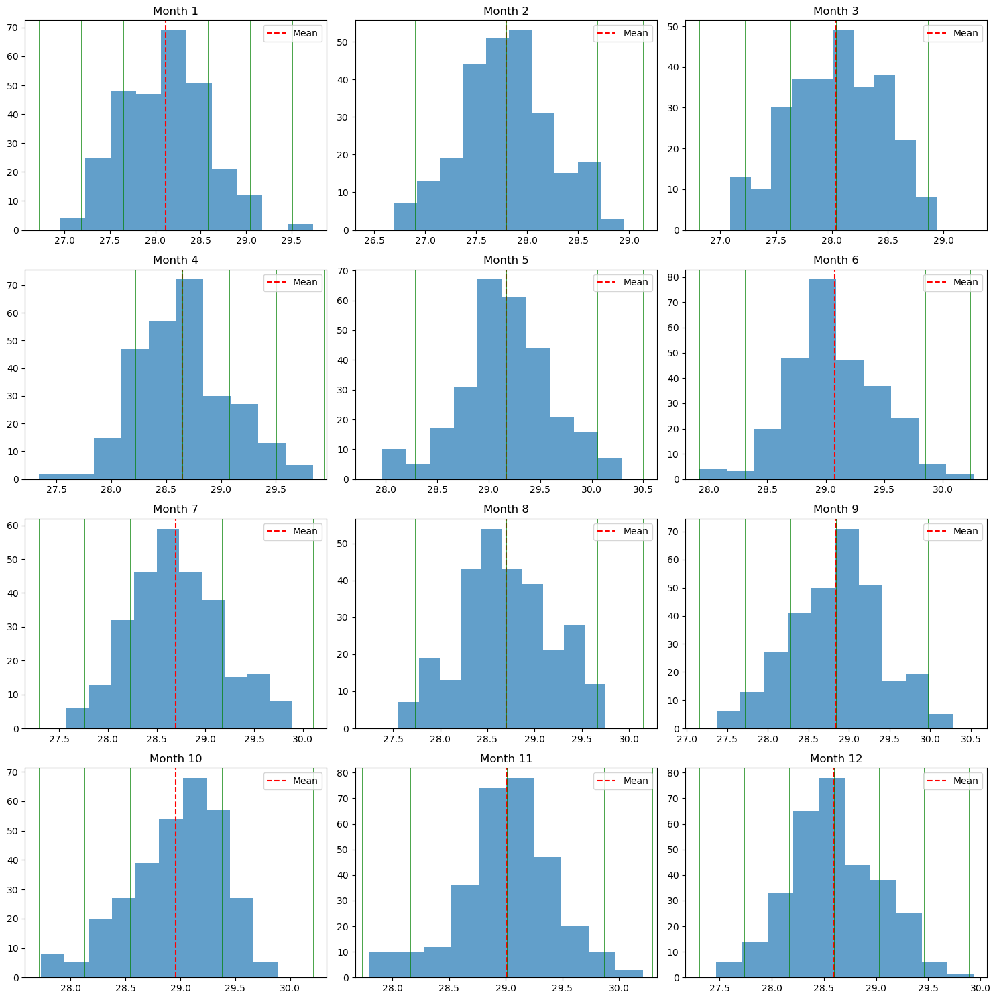

In [142]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15))
months = day_std_by_month.index

for i, month in enumerate(months, 1):
    ax = axs[(i-1)//3, (i-1)%3]
    values = avg_day_sst_df[avg_day_sst_df['month'] == month]['sst']
    mean = values.mean()
    std = day_std_by_month[month]
    ax.hist(values, bins=10, alpha=0.7)
    ax.axvline(mean, color='r', linestyle='--', label='Mean')
    for j in range(-3, 4):
        ax.axvline(mean + j * std, color='g', linestyle='-', linewidth=0.5)
    ax.set_title(f'Month {month}')
    ax.legend()
#     break

# Adjust layout
plt.tight_layout()
plt.show()

In [356]:
from datetime import datetime
def centered_percentile_list(date, base_df, variable_name):
    
    filtered_df = base_df[(base_df["time"] >= datetime(1960, 12, 29))&(base_df["time"] <= datetime(1991, 1, 2))]
    window_values = []
    for x in filtered_df[filtered_df['date'] == date]['time']:

        window_values.extend(list(filtered_df[(filtered_df['time'] >= x - pd.Timedelta(days=2)) &
                     (filtered_df['time'] <= x + pd.Timedelta(days=2))][variable_name]))
    return window_values

In [310]:
# Create a range of dates from January 1st, 2024, to December 31st, 2024
start_date = '2024-01-01'
end_date = '2024-12-31'
dates = pd.date_range(start=start_date, end=end_date, freq='D')

# Create a DataFrame with the dates
pdf = pd.DataFrame({'date': dates})

In [313]:
# Assuming df is your DataFrame containing the latitudes and longitudes
unique_latitudes = oisst_df_daily['lat'].unique()
unique_longitudes = oisst_df_daily['lon'].unique()

# Create a list of tuples containing every combination of latitude and longitude
lat_lon_combinations = [(lat, lon) for lat in unique_latitudes for lon in unique_longitudes]


In [317]:
len(lat_lon_combinations)

1230

In [316]:
oisst_df_daily[oisst_df_daily['time'] == datetime(1981, 9, 1)]

,time,lat,lon,sst,month,day,year,date
0,1981-09-01,1.625,129.625,29.490000,9,1,1981,2024-09-01
1,1981-09-01,1.625,129.875,29.730000,9,1,1981,2024-09-01
2,1981-09-01,1.625,130.125,29.689999,9,1,1981,2024-09-01
3,1981-09-01,1.625,130.375,29.549999,9,1,1981,2024-09-01
4,1981-09-01,1.625,130.625,29.349998,9,1,1981,2024-09-01
...,...,...,...,...,...,...,...,...
1225,1981-09-01,11.625,135.875,29.889999,9,1,1981,2024-09-01
1226,1981-09-01,11.625,136.125,30.349998,9,1,1981,2024-09-01
1227,1981-09-01,11.625,136.375,30.420000,9,1,1981,2024-09-01
1228,1981-09-01,11.625,136.625,30.179998,9,1,1981,2024-09-01


In [321]:
dates

DatetimeIndex(['2024-01-01', '2024-01-02', '2024-01-03', '2024-01-04',
               '2024-01-05', '2024-01-06', '2024-01-07', '2024-01-08',
               '2024-01-09', '2024-01-10',
               ...
               '2024-12-22', '2024-12-23', '2024-12-24', '2024-12-25',
               '2024-12-26', '2024-12-27', '2024-12-28', '2024-12-29',
               '2024-12-30', '2024-12-31'],
              dtype='datetime64[ns]', length=366, freq='D')

In [361]:
all_point_window_dict = {}
for point in lat_lon_combinations:
    window_dict = {}
    current_point = oisst_df_daily[(oisst_df_daily['lat'] == point[0]) & (oisst_df_daily['lon']==point[1])]
    for day in dates:
        window_dict[day] = centered_percentile_list(day,current_point,'sst')
    all_point_window_dict[point] = window_dict

In [ ]:
all_

In [352]:
all

{Timestamp('2024-01-01 00:00:00', freq='D'): 28.761999893188477,
 Timestamp('2024-01-02 00:00:00', freq='D'): 28.631999206542968,
 Timestamp('2024-01-03 00:00:00', freq='D'): 28.619998931884766,
 Timestamp('2024-01-04 00:00:00', freq='D'): 28.577999877929688,
 Timestamp('2024-01-05 00:00:00', freq='D'): 28.58999900817871,
 Timestamp('2024-01-06 00:00:00', freq='D'): 28.77199935913086,
 Timestamp('2024-01-07 00:00:00', freq='D'): 29.029999923706054,
 Timestamp('2024-01-08 00:00:00', freq='D'): 28.81999969482422,
 Timestamp('2024-01-09 00:00:00', freq='D'): 28.90399932861328,
 Timestamp('2024-01-10 00:00:00', freq='D'): 28.97199935913086,
 Timestamp('2024-01-11 00:00:00', freq='D'): 28.97199935913086,
 Timestamp('2024-01-12 00:00:00', freq='D'): 28.97199935913086,
 Timestamp('2024-01-13 00:00:00', freq='D'): 28.97199935913086,
 Timestamp('2024-01-14 00:00:00', freq='D'): 28.89999923706055,
 Timestamp('2024-01-15 00:00:00', freq='D'): 28.775998687744142,
 Timestamp('2024-01-16 00:00:00', 

In [ ]:
#For each day in oisst_df_daily, calculate the percentile that value is
#For each day in oisst_df_daily, calculate the standard deviation that value is

In [348]:
import pickle

In [349]:
with open('all_point_window_dict.pickle', 'wb') as handle:
    pickle.dump(all_point_window_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [345]:
oisst_df_daily

,time,lat,lon,sst,month,day,year,date
0,1981-09-01,1.625,129.625,29.490000,9,1,1981,2024-09-01
1,1981-09-01,1.625,129.875,29.730000,9,1,1981,2024-09-01
2,1981-09-01,1.625,130.125,29.689999,9,1,1981,2024-09-01
3,1981-09-01,1.625,130.375,29.549999,9,1,1981,2024-09-01
4,1981-09-01,1.625,130.625,29.349998,9,1,1981,2024-09-01
...,...,...,...,...,...,...,...,...
4193065,1990-12-31,11.625,135.875,27.549999,12,31,1990,2024-12-31
4193066,1990-12-31,11.625,136.125,27.529999,12,31,1990,2024-12-31
4193067,1990-12-31,11.625,136.375,27.490000,12,31,1990,2024-12-31
4193068,1990-12-31,11.625,136.625,27.449999,12,31,1990,2024-12-31


In [362]:
all_point_window_dict[(1.625,129.625)][Timestamp('2024-01-01 00:00:00', freq='D')]

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2004042523.py:1: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  all_point_window_dict[(1.625,129.625)][Timestamp('2024-01-01 00:00:00', freq='D')]


[28.139999389648438,
 28.349998474121094,
 29.209999084472656,
 28.85999870300293,
 28.479999542236328,
 27.90999984741211,
 28.349998474121094,
 29.28999900817871,
 28.760000228881836,
 28.479999542236328,
 27.739999771118164,
 27.689998626708984,
 27.709999084472656,
 27.729999542236328,
 27.75,
 27.729999542236328,
 27.76999855041504,
 27.829999923706055,
 27.76999855041504,
 27.739999771118164,
 28.439998626708984,
 28.579999923706055,
 28.60999870300293,
 28.719999313354492,
 28.760000228881836,
 27.709999084472656,
 27.729999542236328,
 28.219999313354492,
 28.599998474121094,
 28.53999900817871,
 28.309999465942383,
 28.399999618530273,
 27.829999923706055,
 27.899999618530273,
 28.260000228881836,
 27.709999084472656,
 27.719999313354492,
 27.849998474121094,
 27.969999313354492,
 28.010000228881836,
 29.219999313354492,
 28.94999885559082,
 28.60999870300293,
 27.93000030517578,
 27.670000076293945]

In [ ]:
def get_coord_deviation(time,sst,lat,lon):
    
    sample_set = all_point_window_dict[(lat,lon)]
    
    
    
    avg_day_sst_df.groupby('month')['sst'].std()

In [ ]:
oisst_df_daily['deviation'] = oisst_df_daily.apply(lambda row: something(row['time'], row['sst'],row['lat'],row['lon']), axis=1)

In [343]:
all_point_window_dict

{(1.625,
  129.625): {Timestamp('2024-01-01 00:00:00', freq='D'): 28.819999313354494, Timestamp('2024-01-02 00:00:00', freq='D'): 28.81399917602539, Timestamp('2024-01-03 00:00:00', freq='D'): 28.760000228881836, Timestamp('2024-01-04 00:00:00', freq='D'): 28.743999862670897, Timestamp('2024-01-05 00:00:00', freq='D'): 28.70799903869629, Timestamp('2024-01-06 00:00:00', freq='D'): 28.70799903869629, Timestamp('2024-01-07 00:00:00', freq='D'): 28.469998931884767, Timestamp('2024-01-08 00:00:00', freq='D'): 28.87199935913086, Timestamp('2024-01-09 00:00:00', freq='D'): 28.867999649047853, Timestamp('2024-01-10 00:00:00', freq='D'): 28.907999801635743, Timestamp('2024-01-11 00:00:00', freq='D'): 28.95599937438965, Timestamp('2024-01-12 00:00:00', freq='D'): 28.96399917602539, Timestamp('2024-01-13 00:00:00', freq='D'): 28.88399887084961, Timestamp('2024-01-14 00:00:00', freq='D'): 28.81199951171875, Timestamp('2024-01-15 00:00:00', freq='D'): 28.89199905395508, Timestamp('2024-01-16 00:00

In [341]:
window_dict

{Timestamp('2024-01-01 00:00:00', freq='D'): 28.819999313354494,
 Timestamp('2024-01-02 00:00:00', freq='D'): 28.81399917602539,
 Timestamp('2024-01-03 00:00:00', freq='D'): 28.760000228881836,
 Timestamp('2024-01-04 00:00:00', freq='D'): 28.743999862670897,
 Timestamp('2024-01-05 00:00:00', freq='D'): 28.70799903869629,
 Timestamp('2024-01-06 00:00:00', freq='D'): 28.70799903869629,
 Timestamp('2024-01-07 00:00:00', freq='D'): 28.469998931884767,
 Timestamp('2024-01-08 00:00:00', freq='D'): 28.87199935913086,
 Timestamp('2024-01-09 00:00:00', freq='D'): 28.867999649047853,
 Timestamp('2024-01-10 00:00:00', freq='D'): 28.907999801635743,
 Timestamp('2024-01-11 00:00:00', freq='D'): 28.95599937438965,
 Timestamp('2024-01-12 00:00:00', freq='D'): 28.96399917602539,
 Timestamp('2024-01-13 00:00:00', freq='D'): 28.88399887084961,
 Timestamp('2024-01-14 00:00:00', freq='D'): 28.81199951171875,
 Timestamp('2024-01-15 00:00:00', freq='D'): 28.89199905395508,
 Timestamp('2024-01-16 00:00:00', 

In [311]:
window_list = []
for day in dates:
    window_list.append(centered_percentile_list(day,oisst_df_daily,'sst'))

KeyboardInterrupt: 

In [298]:

def exceedance_rate_for_base_period(climate_data, variable_name):
    # Create an empty DataFrame to store the exceedance rates for each iteration
    exceedance_rates = {}
    all_exceedance_data = {}

    # Loop through each year in the dataset
    for out_of_base_year in range(1961, 1990 + 1):
        print(out_of_base_year)
        # Extract base period data (29 years)
        base_period_data = climate_data[~(climate_data['time'].dt.year == out_of_base_year)].copy()
        out_of_base_data = climate_data[climate_data['time'].dt.year == out_of_base_year].copy()
        # Loop through each in-base year to construct 30-year blocks
        exceedance_dict = {}
        for in_base_year in [year for year in range(1961, 1990 + 1) if year != out_of_base_year]:
            # Construct a 30-year block by repeating one in-base year
            block_data = pd.concat([base_period_data, climate_data[climate_data['time'].dt.year == in_base_year]])
            out_of_base_data['THRESHOLD'] = out_of_base_data['date'].apply(lambda day_value: centered_percentile(day_value,base_period_data,variable_name))
            
            # Calculate exceedance rate for the out-of-base year
            
            exceedance_rate = (out_of_base_data[variable_name]>out_of_base_data['THRESHOLD']).mean()       
            
            # Store the exceedance rate for this iteration
            # Should the exceedance rate be calculated from the average?
            exceedance_dict[in_base_year] = exceedance_rate
            
        exceedance_rates[out_of_base_year] = sum(exceedance_dict.values()) / len(exceedance_dict)
#         print(sum(exceedance_dict.values()) / len(exceedance_dict))
        all_exceedance_data[out_of_base_year] = exceedance_dict

    return exceedance_rates, all_exceedance_data

In [299]:
def exceedance_rate_for_outbase_period(climate_data, variable_name):
 
    # Generate a date range for every day in 2024
    start_date = '2024-01-01'
    end_date = '2024-12-31'
    date_range = pd.date_range(start_date, end_date, freq='D')

    # Create an empty DataFrame with date ragne to store the exceedance rates
    df_exceedance = pd.DataFrame({'date': date_range})


    df_exceedance['THRESHOLD'] = df_exceedance['date'].apply(lambda day_value: centered_percentile(day_value,climate_data,variable_name))

    return df_exceedance

In [300]:
oisst_df_daily

,time,lat,lon,sst,month,day,year
0,1981-09-01,1.625,129.625,29.490000,9,1,1981
1,1981-09-01,1.625,129.875,29.730000,9,1,1981
2,1981-09-01,1.625,130.125,29.689999,9,1,1981
3,1981-09-01,1.625,130.375,29.549999,9,1,1981
4,1981-09-01,1.625,130.625,29.349998,9,1,1981
...,...,...,...,...,...,...,...
4193065,1990-12-31,11.625,135.875,27.549999,12,31,1990
4193066,1990-12-31,11.625,136.125,27.529999,12,31,1990
4193067,1990-12-31,11.625,136.375,27.490000,12,31,1990
4193068,1990-12-31,11.625,136.625,27.449999,12,31,1990


In [301]:
oisst_df_daily['date'] = "2024-" + oisst_df_daily['time'].dt.strftime('%m-%d')
oisst_df_daily['date'] = pd.to_datetime(oisst_df_daily['date'], format='%Y-%m-%d')

In [302]:
oisst_df_daily

,time,lat,lon,sst,month,day,year,date
0,1981-09-01,1.625,129.625,29.490000,9,1,1981,2024-09-01
1,1981-09-01,1.625,129.875,29.730000,9,1,1981,2024-09-01
2,1981-09-01,1.625,130.125,29.689999,9,1,1981,2024-09-01
3,1981-09-01,1.625,130.375,29.549999,9,1,1981,2024-09-01
4,1981-09-01,1.625,130.625,29.349998,9,1,1981,2024-09-01
...,...,...,...,...,...,...,...,...
4193065,1990-12-31,11.625,135.875,27.549999,12,31,1990,2024-12-31
4193066,1990-12-31,11.625,136.125,27.529999,12,31,1990,2024-12-31
4193067,1990-12-31,11.625,136.375,27.490000,12,31,1990,2024-12-31
4193068,1990-12-31,11.625,136.625,27.449999,12,31,1990,2024-12-31


In [ ]:
exceed_rates_TMAX = exceedance_rate_for_outbase_period(df, "TMAX")

In [ ]:
TMAX_dict = dict(zip(exceed_rates_TMAX['DAY'], exceed_rates_TMAX['THRESHOLD']))

In [296]:
std_by_month

month
1     0.367792
2     0.388431
3     0.289685
4     0.217079
5     0.276595
6     0.216910
7     0.408253
8     0.393790
9     0.458990
10    0.268110
11    0.231529
12    0.271392
Name: sst, dtype: float64

In [293]:
oisst_df_daily['month'] = oisst_df_daily['time'].dt.month
oisst_df_daily['day'] = oisst_df_daily['time'].dt.day
oisst_df_daily['year'] = oisst_df_daily['time'].dt.year

In [294]:
std_by_day = oisst_df_daily.groupby(['month','day','lat','lon'])['sst'].std()

In [295]:
std_by_day

month  day  lat     lon    
1      1    1.625   129.625    0.609886
                    129.875    0.608628
                    130.125    0.629385
                    130.375    0.681850
                    130.625    0.716615
                                 ...   
12     31   11.625  135.875    0.564659
                    136.125    0.588559
                    136.375    0.652108
                    136.625    0.700102
                    136.875    0.702839
Name: sst, Length: 450180, dtype: float64

In [ ]:
# avg_daily_oisst = {}
# for day in oisst_df_daily['time'].unique():
#     current_month = getAllSSTJSON(oisst_df, time = month)
#     current_month['sst_parea'] = current_month['sst'] * current_month['parea']
#     avg_sst[month] = current_month['sst_parea'].sum()

# std_by_month = avg_sst_df.groupby('month')['sst'].std()

In [285]:
oisst_df_daily

,time,lat,lon,sst
0,1981-09-01,1.625,129.625,29.490000
1,1981-09-01,1.625,129.875,29.730000
2,1981-09-01,1.625,130.125,29.689999
3,1981-09-01,1.625,130.375,29.549999
4,1981-09-01,1.625,130.625,29.349998
...,...,...,...,...
4193065,1990-12-31,11.625,135.875,27.549999
4193066,1990-12-31,11.625,136.125,27.529999
4193067,1990-12-31,11.625,136.375,27.490000
4193068,1990-12-31,11.625,136.625,27.449999


In [284]:
oisst_df_daily

,time,lat,lon,sst
0,1981-09-01,1.625,129.625,29.490000
1,1981-09-01,1.625,129.875,29.730000
2,1981-09-01,1.625,130.125,29.689999
3,1981-09-01,1.625,130.375,29.549999
4,1981-09-01,1.625,130.625,29.349998
...,...,...,...,...
4193065,1990-12-31,11.625,135.875,27.549999
4193066,1990-12-31,11.625,136.125,27.529999
4193067,1990-12-31,11.625,136.375,27.490000
4193068,1990-12-31,11.625,136.625,27.449999


In [282]:
avg_day_sst

{numpy.datetime64('1981-09-01T00:00:00.000000000'): 28.74367280202823,
 numpy.datetime64('1981-09-02T00:00:00.000000000'): 28.877061013987838,
 numpy.datetime64('1981-09-03T00:00:00.000000000'): 28.64298135697289,
 numpy.datetime64('1981-09-04T00:00:00.000000000'): 28.5202363245214,
 numpy.datetime64('1981-09-05T00:00:00.000000000'): 28.596341876776677,
 numpy.datetime64('1981-09-06T00:00:00.000000000'): 29.034304762362805,
 numpy.datetime64('1981-09-07T00:00:00.000000000'): 29.601407715751538,
 numpy.datetime64('1981-09-08T00:00:00.000000000'): 29.82425915624797,
 numpy.datetime64('1981-09-09T00:00:00.000000000'): 29.802548982291704,
 numpy.datetime64('1981-09-10T00:00:00.000000000'): 29.572790846835353,
 numpy.datetime64('1981-09-11T00:00:00.000000000'): 29.14930959272266,
 numpy.datetime64('1981-09-12T00:00:00.000000000'): 29.170464308242877,
 numpy.datetime64('1981-09-13T00:00:00.000000000'): 29.09509588463643,
 numpy.datetime64('1981-09-14T00:00:00.000000000'): 29.058579944881867,

In [143]:
avg_day_sst_df

,time,sst,month
0,1981-09-01,28.743673,9
1,1981-09-02,28.877061,9
2,1981-09-03,28.642981,9
3,1981-09-04,28.520236,9
4,1981-09-05,28.596342,9
...,...,...,...
3404,1990-12-27,27.553203,12
3405,1990-12-28,27.730723,12
3406,1990-12-29,28.180934,12
3407,1990-12-30,28.205052,12


In [148]:
def get_std(month,sst):
    values = avg_day_sst_df[avg_day_sst_df['month'] == month]['sst']
    mean = values.mean()
    return (sst-mean)/(day_std_by_month[month])


In [149]:
avg_day_sst_df['deviation'] = avg_day_sst_df.apply(lambda row: get_std(row['month'], row['sst']), axis=1)

In [154]:
max(avg_day_sst_df['deviation'])

3.4878796286747016

In [155]:
min(avg_day_sst_df['deviation'])

-3.0518809249152223

In [158]:
min(avg_day_sst_df['time'])

Timestamp('1981-09-01 00:00:00')

In [184]:
day_std_by_month.to_pickle("./day_std_by_month.pkl")

In [156]:
avg_day_sst_df.to_pickle("./avg_day_sst.pkl")  

In [163]:
oisst_daily = xr.open_dataset(oisst_daily_url, decode_times=True)
all_oisst_daily = oisst_daily['sst'].loc[{'lat': slice(minlat,maxlat),
                              'lon': slice(minlon,maxlon)}]
all_oisst_df_daily = all_oisst_daily.to_dataframe()               



Error:curl error: Failure when receiving data from the peer


In [170]:
all_oisst_df_daily.reset_index(inplace= True)

In [175]:
all_oisst_avg = {}
for day in all_oisst_df_daily['time'].unique():
    current_day = getAllSSTJSON(all_oisst_df_daily,time = day)
    current_day['sst_parea'] = current_day['sst']*current_day['parea']
    all_oisst_avg[day] = current_day['sst_parea'].sum()

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_land, how='difference')
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:56: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3395
Right CRS: EPSG:4326

  trimmed = gpd.overlay(json_gdf,palau_eez, how = "intersection")
/var/folders/d6/w300s4cx3qj10pqdcy5859bc0000gn/T/ipykernel_66870/2076456051.py:53: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the 

In [176]:
all_oisst_avg

{numpy.datetime64('1981-09-01T00:00:00.000000000'): 28.74367280202823,
 numpy.datetime64('1981-09-02T00:00:00.000000000'): 28.877061013987838,
 numpy.datetime64('1981-09-03T00:00:00.000000000'): 28.64298135697289,
 numpy.datetime64('1981-09-04T00:00:00.000000000'): 28.5202363245214,
 numpy.datetime64('1981-09-05T00:00:00.000000000'): 28.596341876776677,
 numpy.datetime64('1981-09-06T00:00:00.000000000'): 29.034304762362805,
 numpy.datetime64('1981-09-07T00:00:00.000000000'): 29.601407715751538,
 numpy.datetime64('1981-09-08T00:00:00.000000000'): 29.82425915624797,
 numpy.datetime64('1981-09-09T00:00:00.000000000'): 29.802548982291704,
 numpy.datetime64('1981-09-10T00:00:00.000000000'): 29.572790846835353,
 numpy.datetime64('1981-09-11T00:00:00.000000000'): 29.14930959272266,
 numpy.datetime64('1981-09-12T00:00:00.000000000'): 29.170464308242877,
 numpy.datetime64('1981-09-13T00:00:00.000000000'): 29.09509588463643,
 numpy.datetime64('1981-09-14T00:00:00.000000000'): 29.058579944881867,

In [178]:
all_oisst_avg_df = pd.DataFrame(list(all_oisst_avg.items()), columns=['time', 'sst'])

In [180]:
all_oisst_avg_df

,time,sst
0,1981-09-01,28.743673
1,1981-09-02,28.877061
2,1981-09-03,28.642981
3,1981-09-04,28.520236
4,1981-09-05,28.596342
...,...,...
12535,2015-12-27,28.597052
12536,2015-12-28,28.460221
12537,2015-12-29,28.339328
12538,2015-12-30,28.327710


In [192]:
all_oisst_avg_df['month'] = all_oisst_avg_df['time'].dt.month

In [193]:
def get_std(month,sst,std_dict = day_std_by_month):
    values = avg_day_sst_df[avg_day_sst_df['month'] == month]['sst']
    mean = values.mean()
    return (sst-mean)/(std_dict[month])

In [194]:
all_oisst_avg_df['deviation'] = all_oisst_avg_df.apply(lambda row: get_std(row['month'], row['sst']), axis=1)

In [195]:
all_oisst_avg_df

,time,sst,month,deviation
0,1981-09-01,28.743673,9,-0.175726
1,1981-09-02,28.877061,9,0.061361
2,1981-09-03,28.642981,9,-0.354697
3,1981-09-04,28.520236,9,-0.572866
4,1981-09-05,28.596342,9,-0.437594
...,...,...,...,...
12535,2015-12-27,28.597052,12,-0.001871
12536,2015-12-28,28.460221,12,-0.318786
12537,2015-12-29,28.339328,12,-0.598787
12538,2015-12-30,28.327710,12,-0.625695


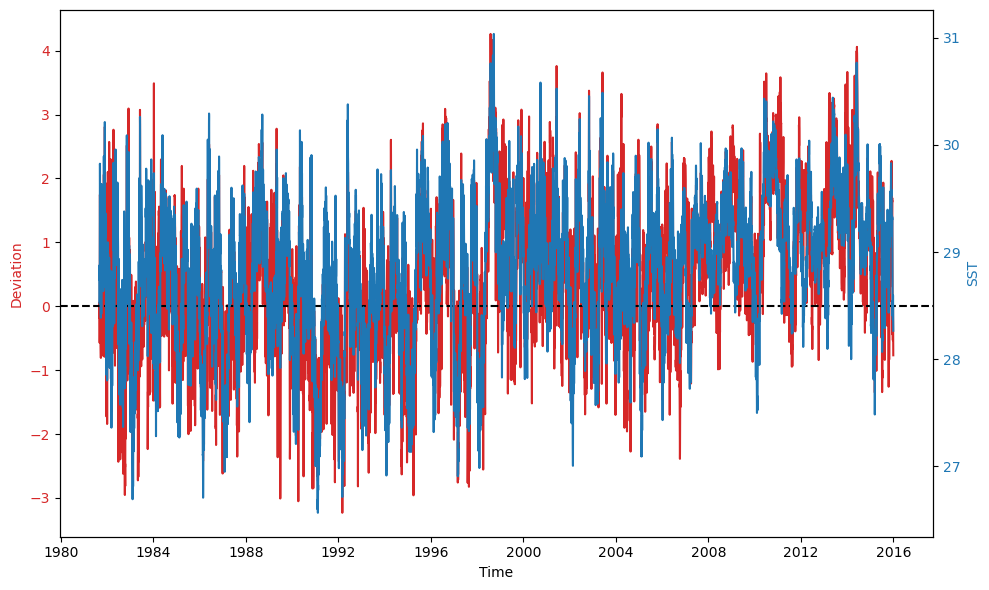

In [202]:
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Deviation', color=color)
ax1.plot(all_oisst_avg_df['time'], all_oisst_avg_df['deviation'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('SST', color=color)  
ax2.plot(all_oisst_avg_df['time'], all_oisst_avg_df['sst'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

ax1.axhline(0, color='k', linestyle='--')

fig.tight_layout()  
plt.show()

In [259]:
all_oisst_avg_df

,time,sst,month,deviation
0,1981-09-01,28.743673,9,-0.175726
1,1981-09-02,28.877061,9,0.061361
2,1981-09-03,28.642981,9,-0.354697
3,1981-09-04,28.520236,9,-0.572866
4,1981-09-05,28.596342,9,-0.437594
...,...,...,...,...
12535,2015-12-27,28.597052,12,-0.001871
12536,2015-12-28,28.460221,12,-0.318786
12537,2015-12-29,28.339328,12,-0.598787
12538,2015-12-30,28.327710,12,-0.625695


In [262]:
day_std_by_month.index

RangeIndex(start=0, stop=12540, step=1)

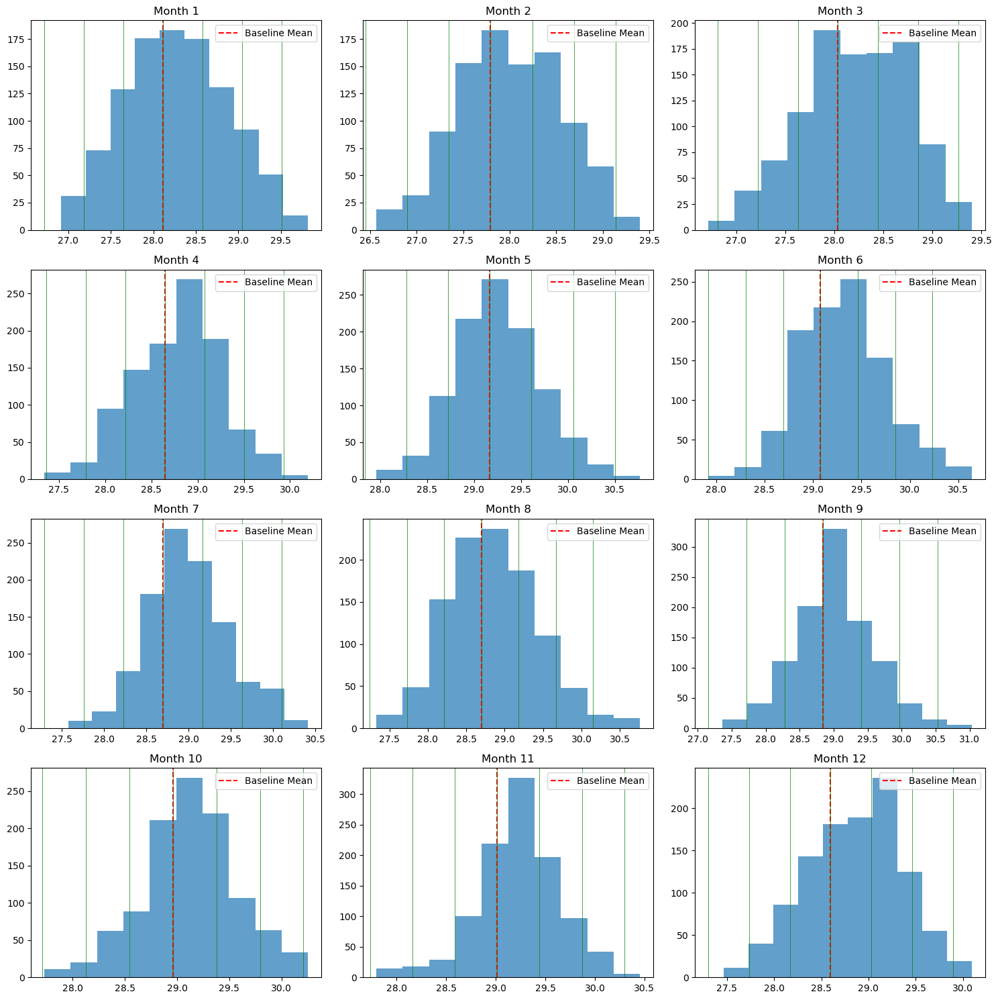

In [278]:
#Includes all oisst months

fig, axs = plt.subplots(4, 3, figsize=(15, 15))
months = day_std_by_month.index

for i, month in enumerate(months, 1):
    ax = axs[(i-1)//3, (i-1)%3]
    base_values = avg_day_sst_df[avg_day_sst_df['month'] == month]['sst']
    base_mean = base_values.mean()
    base_std = day_std_by_month[month]
    
    
    values = all_oisst_avg_df[all_oisst_avg_df['month'] == month]['sst']
    ax.hist(values, bins=10, alpha=0.7)
    
    ax.axvline(base_mean, color='r', linestyle='--', label='Baseline Mean')
    for j in range(-3, 4):
        ax.axvline(base_mean + j * base_std, color='g', linestyle='-', linewidth=0.5)
    ax.set_title(f'Month {month}')
    ax.legend()
#     break

# Adjust layout
plt.tight_layout()
plt.show()

In [200]:
all_oisst_avg_df.to_pickle("./all_oisst_avg_df.pkl")  

In [203]:
all_oisst_df_daily

,time,lat,lon,sst
0,1981-09-01,1.625,129.625,29.490000
1,1981-09-01,1.625,129.875,29.730000
2,1981-09-01,1.625,130.125,29.689999
3,1981-09-01,1.625,130.375,29.549999
4,1981-09-01,1.625,130.625,29.349998
...,...,...,...,...
15424195,2015-12-31,11.625,135.875,28.080000
15424196,2015-12-31,11.625,136.125,28.049999
15424197,2015-12-31,11.625,136.375,27.980000
15424198,2015-12-31,11.625,136.625,27.879999


In [204]:
import os

In [207]:
def filter_palau(df):
    filtered = df[(df["latitude"]>= 1.5214)&
                                (df["latitude"]<=11.6587)&(df["longitude"]<=137.0541)&
                                (df["longitude"]>=129.4088)]
    return filtered

In [205]:
ssp126_list = []
folder = "/Volumes/PACIOOS2/PACIOOSFolder/Misc Files/CMIP6D/historical.ssp119.ssp126.ssp245.ssp370.ssp585/"
for x in os.listdir(folder):
    if "tos_Omon_HadGEM3-GC31-MM_ssp126_r1i1p1f3_gn_" in x:
        ssp126_list.append(xr.open_dataset(folder + x, decode_times=True))

In [208]:
ssp126_dfs = []
for x in ssp126_list:
    df = x.tos.to_dataframe()
    df = filter_palau(df)
    ssp126_dfs.append(df.dropna(subset=['tos']))

In [209]:
master_ssp126 = pd.concat(ssp126_dfs)

In [210]:
master_ssp126.to_pickle('master_ssp126_pacific.pkl')

In [211]:
master_ssp126.reset_index(inplace = True)

In [212]:
master_ssp126

,time,j,i,latitude,longitude,tos
0,2015-01-16 00:00:00,690,226,1.749728,129.50,29.677967
1,2015-01-16 00:00:00,690,227,1.749728,129.75,29.683485
2,2015-01-16 00:00:00,690,228,1.749728,130.00,29.659296
3,2015-01-16 00:00:00,690,229,1.749728,130.25,29.660063
4,2015-01-16 00:00:00,690,230,1.749728,130.50,29.646633
...,...,...,...,...,...,...
1275547,2100-12-16 00:00:00,729,252,11.423554,136.00,29.338228
1275548,2100-12-16 00:00:00,729,253,11.423554,136.25,29.336264
1275549,2100-12-16 00:00:00,729,254,11.423554,136.50,29.340717
1275550,2100-12-16 00:00:00,729,255,11.423554,136.75,29.345821


In [216]:
master_ssp126['time'].unique()

array([cftime.Datetime360Day(2015, 1, 16, 0, 0, 0, 0, has_year_zero=True),
       cftime.Datetime360Day(2015, 2, 16, 0, 0, 0, 0, has_year_zero=True),
       cftime.Datetime360Day(2015, 3, 16, 0, 0, 0, 0, has_year_zero=True),
       ...,
       cftime.Datetime360Day(2100, 10, 16, 0, 0, 0, 0, has_year_zero=True),
       cftime.Datetime360Day(2100, 11, 16, 0, 0, 0, 0, has_year_zero=True),
       cftime.Datetime360Day(2100, 12, 16, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)

In [218]:
master_ssp126['month'] = master_ssp126['time'].apply(lambda x: x.month)

In [219]:
master_ssp126

,time,j,i,latitude,longitude,tos,month
0,2015-01-16 00:00:00,690,226,1.749728,129.50,29.677967,1
1,2015-01-16 00:00:00,690,227,1.749728,129.75,29.683485,1
2,2015-01-16 00:00:00,690,228,1.749728,130.00,29.659296,1
3,2015-01-16 00:00:00,690,229,1.749728,130.25,29.660063,1
4,2015-01-16 00:00:00,690,230,1.749728,130.50,29.646633,1
...,...,...,...,...,...,...,...
1275547,2100-12-16 00:00:00,729,252,11.423554,136.00,29.338228,12
1275548,2100-12-16 00:00:00,729,253,11.423554,136.25,29.336264,12
1275549,2100-12-16 00:00:00,729,254,11.423554,136.50,29.340717,12
1275550,2100-12-16 00:00:00,729,255,11.423554,136.75,29.345821,12


In [220]:
master_ssp126['deviation'] = master_ssp126.apply(lambda row: get_std(row['month'], row['tos']), axis=1)

In [221]:
master_ssp126

,time,j,i,latitude,longitude,tos,month,deviation
0,2015-01-16 00:00:00,690,226,1.749728,129.50,29.677967,1,3.362678
1,2015-01-16 00:00:00,690,227,1.749728,129.75,29.683485,1,3.374541
2,2015-01-16 00:00:00,690,228,1.749728,130.00,29.659296,1,3.322536
3,2015-01-16 00:00:00,690,229,1.749728,130.25,29.660063,1,3.324184
4,2015-01-16 00:00:00,690,230,1.749728,130.50,29.646633,1,3.295311
...,...,...,...,...,...,...,...,...
1275547,2100-12-16 00:00:00,729,252,11.423554,136.00,29.338228,12,1.714771
1275548,2100-12-16 00:00:00,729,253,11.423554,136.25,29.336264,12,1.710220
1275549,2100-12-16 00:00:00,729,254,11.423554,136.50,29.340717,12,1.720536
1275550,2100-12-16 00:00:00,729,255,11.423554,136.75,29.345821,12,1.732357


In [224]:
# Extract year, month, and day components from cftime.Datetime360Day objects
year = [date.year for date in master_ssp126['time']]
month = [date.month for date in master_ssp126['time']]
day = [date.day for date in master_ssp126['time']]

# Create datetime objects
datetime_objects = [pd.Timestamp(year=y, month=m, day=d) for y, m, d in zip(year, month, day)]

In [229]:
master_ssp126['time_adjusted'] = datetime_objects

In [ ]:
master_ssp126['deviation'] = master_ssp126.apply(lambda row: get_std(row['month'], row['tos']), axis=1)

In [238]:
master_ssp126['time_adjusted'] = master_ssp126['time'].apply(lambda row: pd.Timestamp(year=row.year, month=row.month, day=row.day))

In [243]:
master_ssp126

,time,j,i,latitude,longitude,tos,month,deviation,time_adjusted
0,2015-01-16 00:00:00,690,226,1.749728,129.50,29.677967,1,3.362678,2015-01-16
1,2015-01-16 00:00:00,690,227,1.749728,129.75,29.683485,1,3.374541,2015-01-16
2,2015-01-16 00:00:00,690,228,1.749728,130.00,29.659296,1,3.322536,2015-01-16
3,2015-01-16 00:00:00,690,229,1.749728,130.25,29.660063,1,3.324184,2015-01-16
4,2015-01-16 00:00:00,690,230,1.749728,130.50,29.646633,1,3.295311,2015-01-16
...,...,...,...,...,...,...,...,...,...
1275547,2100-12-16 00:00:00,729,252,11.423554,136.00,29.338228,12,1.714771,2100-12-16
1275548,2100-12-16 00:00:00,729,253,11.423554,136.25,29.336264,12,1.710220,2100-12-16
1275549,2100-12-16 00:00:00,729,254,11.423554,136.50,29.340717,12,1.720536,2100-12-16
1275550,2100-12-16 00:00:00,729,255,11.423554,136.75,29.345821,12,1.732357,2100-12-16


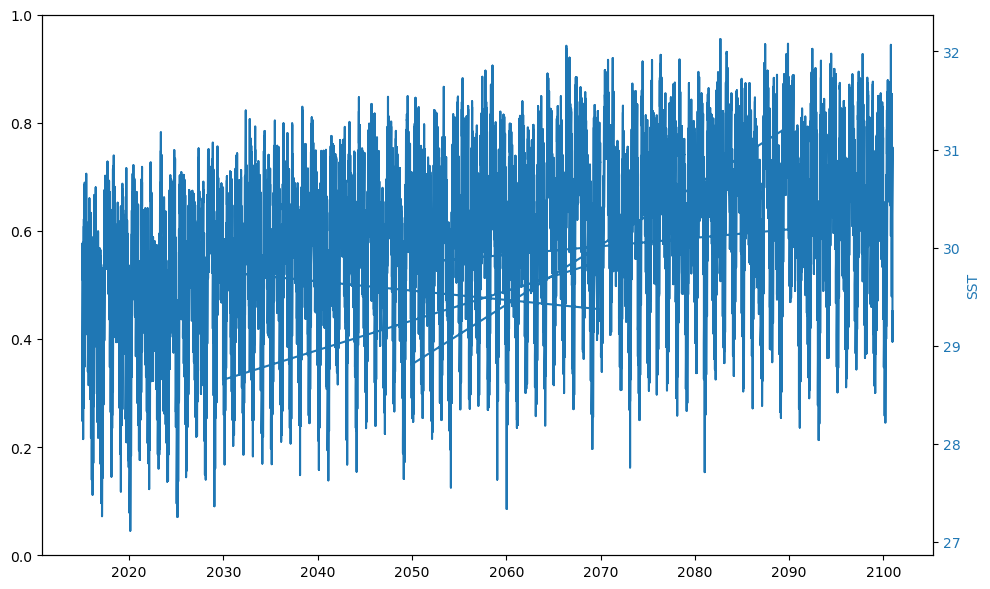

In [241]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# color = 'tab:red'
# ax1.set_xlabel('Time')
# ax1.set_ylabel('Deviation', color=color)
# ax1.plot(master_ssp126['time_adjusted'], master_ssp126['deviation'], color=color)
# ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('SST', color=color)  
ax2.plot(master_ssp126['time_adjusted'], master_ssp126['tos'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# ax1.axhline(0, color='k', linestyle='--')

fig.tight_layout()  
plt.show()

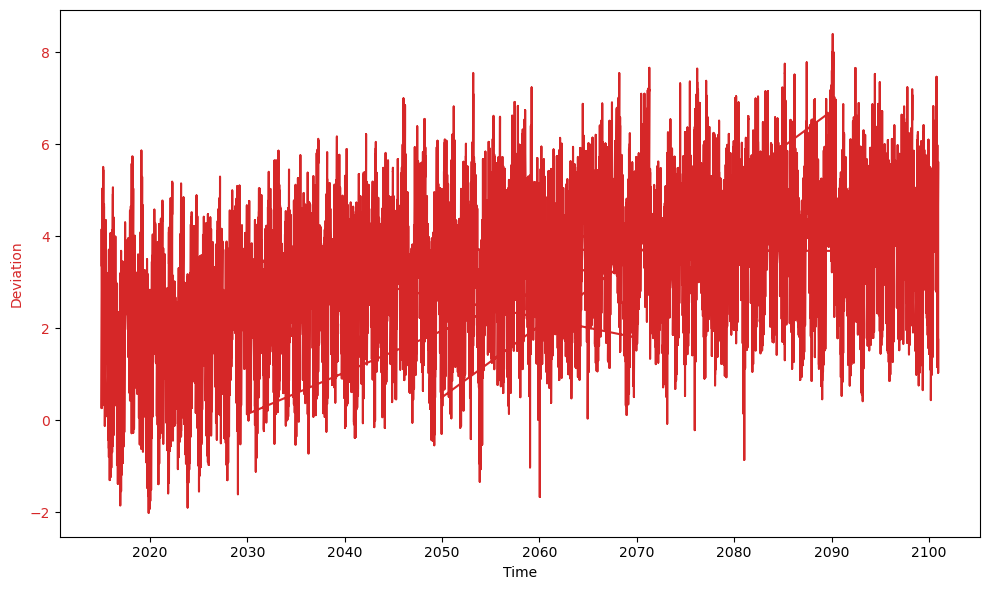

In [242]:
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Deviation', color=color)
ax1.plot(master_ssp126['time_adjusted'], master_ssp126['deviation'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2 = ax1.twinx()  
# color = 'tab:blue'
# ax2.set_ylabel('SST', color=color)  
# ax2.plot(datetime_objects, master_ssp126['tos'], color=color)
# ax2.tick_params(axis='y', labelcolor=color)

# ax1.axhline(0, color='k', linestyle='--')

fig.tight_layout()  
plt.show()

In [ ]:
master_ssp126

In [246]:
avg_ssp126 = master_ssp126.groupby('time_adjusted')['tos'].mean()

In [247]:
avg_ssp126

time_adjusted
2015-01-16    29.055882
2015-02-16    29.141140
2015-03-16    29.397615
2015-04-16    29.741085
2015-05-16    29.842161
                ...    
2100-08-16    30.948521
2100-09-16    30.892683
2100-10-16    30.885906
2100-11-16    30.621595
2100-12-16    30.252541
Name: tos, Length: 1032, dtype: float32

In [253]:
std_avg_ssp126 = master_ssp126.groupby('time_adjusted')['deviation'].mean()

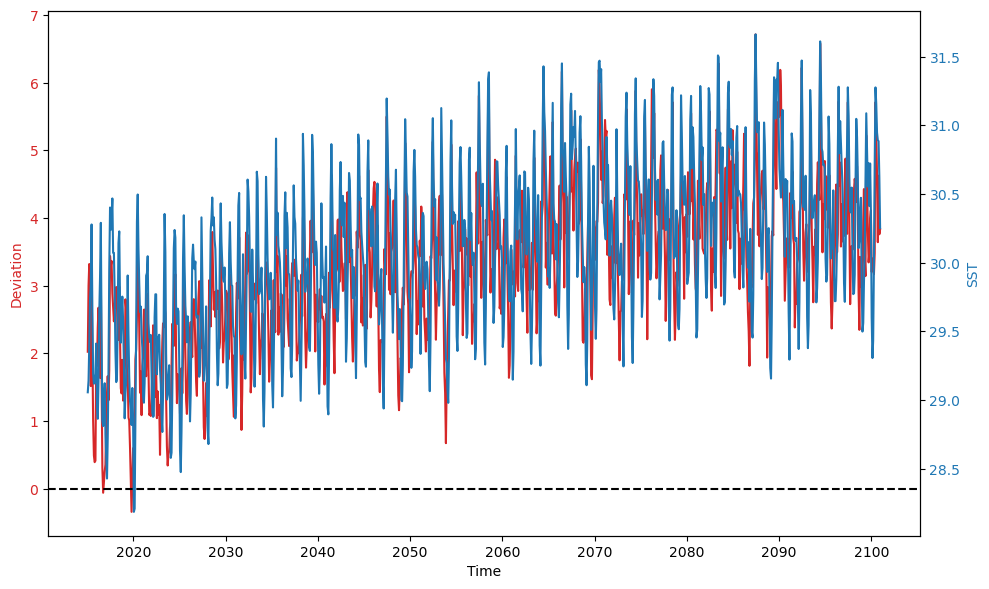

In [255]:
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Deviation', color=color)
ax1.plot(std_avg_ssp126, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('SST', color=color)  
ax2.plot(avg_ssp126, color=color)
ax2.tick_params(axis='y', labelcolor=color)

ax1.axhline(0, color='k', linestyle='--')

fig.tight_layout()  
plt.show()

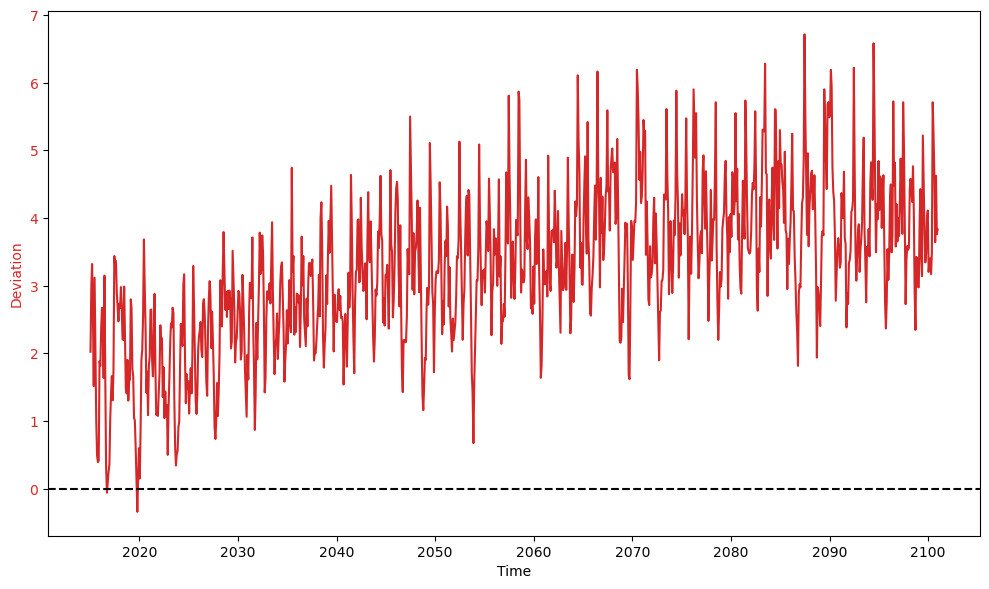

In [256]:
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Deviation', color=color)
ax1.plot(std_avg_ssp126, color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2 = ax1.twinx()  
# color = 'tab:blue'
# ax2.set_ylabel('SST', color=color)  
# ax2.plot(avg_ssp126, color=color)
# ax2.tick_params(axis='y', labelcolor=color)

ax1.axhline(0, color='k', linestyle='--')

fig.tight_layout()  
plt.show()

In [268]:
avg_ssp126

time_adjusted
2015-01-16    29.055882
2015-02-16    29.141140
2015-03-16    29.397615
2015-04-16    29.741085
2015-05-16    29.842161
                ...    
2100-08-16    30.948521
2100-09-16    30.892683
2100-10-16    30.885906
2100-11-16    30.621595
2100-12-16    30.252541
Name: tos, Length: 1032, dtype: float32

In [272]:
avg_ssp126_df = avg_ssp126.reset_index()

In [273]:
avg_ssp126_df

,time_adjusted,tos
0,2015-01-16,29.055882
1,2015-02-16,29.141140
2,2015-03-16,29.397615
3,2015-04-16,29.741085
4,2015-05-16,29.842161
...,...,...
1027,2100-08-16,30.948521
1028,2100-09-16,30.892683
1029,2100-10-16,30.885906
1030,2100-11-16,30.621595


In [275]:
avg_ssp126_df['month'] = avg_ssp126_df['time_adjusted'].dt.month

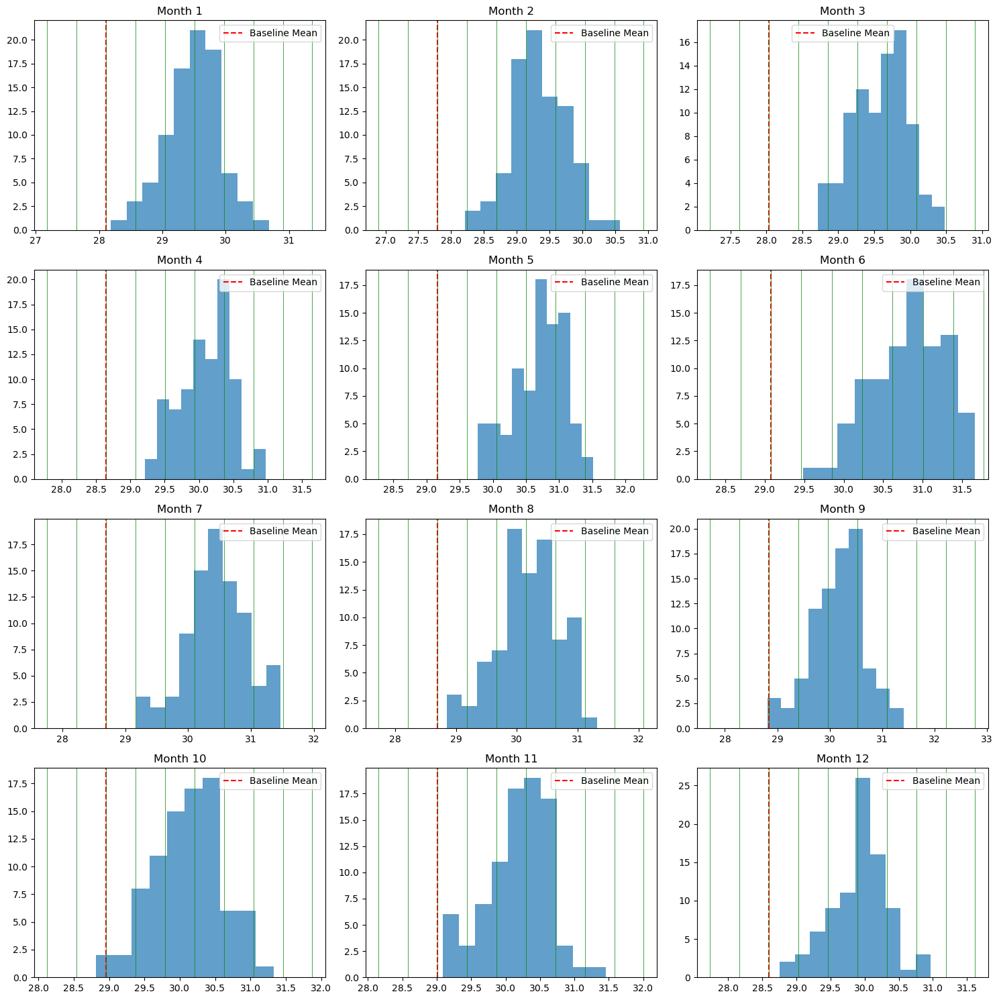

In [281]:
#Includes all oisst months

fig, axs = plt.subplots(4, 3, figsize=(15, 15))
months = day_std_by_month.index

for i, month in enumerate(months, 1):
    ax = axs[(i-1)//3, (i-1)%3]
    base_values = avg_day_sst_df[avg_day_sst_df['month'] == month]['sst']
    base_mean = base_values.mean()
    base_std = day_std_by_month[month]
    
    
    values = avg_ssp126_df[avg_ssp126_df['month'] == month]['tos']
    ax.hist(values, bins=10, alpha=0.7)
    
    ax.axvline(base_mean, color='r', linestyle='--', label='Baseline Mean')
    for j in range(-2, 8):
        ax.axvline(base_mean + j * base_std, color='g', linestyle='-', linewidth=0.5)
    ax.set_title(f'Month {month}')
    ax.legend()
#     break

# Adjust layout
plt.tight_layout()
plt.show()

In [244]:
master_ssp126.groupby('time_adjusted')

In [123]:
avg_day_sst

{numpy.datetime64('1981-09-01T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-02T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-03T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-04T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-05T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-06T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-07T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-08T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-09T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-10T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-11T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-12T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-13T00:00:00.000000000'): 28.07047383271198,
 numpy.datetime64('1981-09-14T00:00:00.000000000'): 28.07047383271198,
 numpy

In [122]:
avg_day_sst_df

,time,sst,month
0,1981-09-01,28.070474,9
1,1981-09-02,28.070474,9
2,1981-09-03,28.070474,9
3,1981-09-04,28.070474,9
4,1981-09-05,28.070474,9
...,...,...,...
3404,1990-12-27,28.070474,12
3405,1990-12-28,28.070474,12
3406,1990-12-29,28.070474,12
3407,1990-12-30,28.070474,12


In [120]:
avg_day_sst_df = pd.DataFrame(list(avg_day_sst.items()), columns=['time', 'sst'])
avg_day_sst_df['month'] = avg_day_sst_df['time'].dt.month
std_day_by_month = avg_day_sst_df.groupby('month')['sst'].std()

In [121]:
std_day_by_month

month
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
Name: sst, dtype: float64

In [90]:
current_month['sst_parea'].sum()

28.920348116807887

In [ ]:
for month in sorted_sst:
    if month != 'GAUS-NOV-2022-sst.nc':
        continue
    current_month = xr.open_dataset(MMEFORECAST + month)
    current_df = current_month.to_dataframe()
    current_df.reset_index(inplace = True)
    current_df = filter_box(current_df)
    current_df = current_df.rename(columns={'lat': 'latitude', 'lon': 'longitude'})
    
    for x in current_df['time'].unique():
        currgeo = getAllSSTJSON(df = current_df, time = x)
        break
    break

In [69]:
parea_oisst['parea'].sum()

1.0

In [71]:
parea_oisst['area'].sum()

50.57156908475038

In [70]:
parea_oisst

,time,lat,lon,sst,point,geometry_x,geometry_y,area,parea
0,1981-09-01,4.875,136.875,29.078999,POINT (136.875 4.875),"POLYGON ((136.750 4.750, 136.750 5.000, 137.05...","POLYGON ((136.750 4.753, 136.750 5.000, 136.94...",0.027392,0.000542
1,1981-09-01,5.125,136.875,29.069332,POINT (136.875 5.125),"POLYGON ((137.054 5.000, 136.750 5.000, 136.75...","POLYGON ((136.948 5.000, 136.750 5.000, 136.75...",0.039583,0.000783
2,1981-09-01,5.375,136.875,29.052334,POINT (136.875 5.375),"POLYGON ((136.750 5.250, 136.750 5.500, 137.05...","POLYGON ((136.750 5.250, 136.750 5.500, 136.78...",0.019536,0.000386
3,1981-09-01,5.625,136.875,29.080332,POINT (136.875 5.625),"POLYGON ((137.054 5.500, 136.750 5.500, 136.75...","POLYGON ((136.788 5.500, 136.750 5.500, 136.75...",0.002257,0.000045
4,1981-09-01,4.625,136.625,29.018999,POINT (136.625 4.625),"POLYGON ((136.500 4.750, 136.750 4.750, 136.75...","POLYGON ((136.500 4.750, 136.747 4.750, 136.74...",0.030710,0.000607
...,...,...,...,...,...,...,...,...,...
870,1981-09-01,6.375,129.625,28.762999,POINT (129.625 6.375),"POLYGON ((129.409 6.500, 129.750 6.500, 129.75...","POLYGON ((129.518 6.500, 129.750 6.500, 129.75...",0.054622,0.001080
871,1981-09-01,6.625,129.625,28.830334,POINT (129.625 6.625),"POLYGON ((129.750 6.500, 129.409 6.500, 129.40...","POLYGON ((129.750 6.500, 129.518 6.500, 129.51...",0.056165,0.001111
872,1981-09-01,6.875,129.625,28.871666,POINT (129.625 6.875),"POLYGON ((129.750 6.750, 129.409 6.750, 129.40...","POLYGON ((129.750 6.750, 129.561 6.750, 129.63...",0.036739,0.000726
873,1981-09-01,7.125,129.625,28.906666,POINT (129.625 7.125),"POLYGON ((129.409 7.250, 129.750 7.250, 129.75...","POLYGON ((129.733 7.250, 129.750 7.250, 129.75...",0.015161,0.000300


In [23]:
oisst_df

sst
time       lat    lon               
1981-09-01 1.625  129.625  29.381332
                  129.875  29.436666
                  130.125  29.394333
                  130.375  29.345667
                  130.625  29.289665
...                              ...
1990-12-01 11.625 135.875  27.721613
                  136.125  27.644194
                  136.375  27.560966
                  136.625  27.548710
                  136.875  27.609676

[137760 rows x 1 columns]

In [ ]:
1961-1990

In [ ]:
#base period
#sample sd by month